# Store Sales Time Series Forecasting

## Imports

In [218]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import kaleido
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose, DecomposeResult
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.api import ExponentialSmoothing
from statsmodels.tsa._stl import STL
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_squared_log_error
from sklearn.model_selection import TimeSeriesSplit
from tqdm.contrib.concurrent import process_map  # or thread_map

import itertools
from math import sqrt
from multiprocessing import cpu_count, freeze_support
import calendar as cal

import warnings

warnings.filterwarnings("ignore")

%matplotlib inline

plotly_base_params = {
    'template': "plotly_white",
    'title_font': dict(size=29, color='#8a8d93', family="Lato, sans-serif"),
    'font': dict(color='#8a8d93'),
    'hoverlabel': dict(bgcolor="#f2f2f2", font_size=13, font_family="Lato, sans-serif")
}

In [389]:
def rmsle(y, y_pred):
    return np.sqrt(mean_squared_log_error(y, y_pred))

## 1. Loading and transforming data

In [4]:
df_oil = pd.read_csv('data/oil.csv')
df_holidays = pd.read_csv('data/holidays_events.csv')
df_stores = pd.read_csv('data/stores.csv')
df_trans = pd.read_csv('data/transactions.csv')

df_train = pd.read_csv('data/train.csv')
df_test = pd.read_csv('data/test.csv')

In [110]:
df_train["date"] = pd.to_datetime(df_train.date)
df_test["date"] = pd.to_datetime(df_test.date)
df_trans["date"] = pd.to_datetime(df_trans.date)
df_holidays["date"] = pd.to_datetime(df_holidays.date)

In [6]:
# Generate Time Related Features
def create_date_features(df):
    df['month'] = df.date.dt.month.astype("int8")
    df['day_of_month'] = df.date.dt.day.astype("int8")
    df['day_of_year'] = df.date.dt.dayofyear.astype("int16")
    df['week_of_month'] = (df.date.apply(lambda d: (d.day - 1) // 7 + 1)).astype("int8")
    df['week_of_year'] = (df.date.dt.weekofyear).astype("int8")
    df['day_of_week'] = (df.date.dt.dayofweek + 1).astype("int8")
    df['year'] = df.date.dt.year.astype("int32")
    df["is_wknd"] = (df.date.dt.weekday // 4).astype("int8")
    df["quarter"] = df.date.dt.quarter.astype("int8")
    df['is_month_start'] = df.date.dt.is_month_start.astype("int8")
    df['is_month_end'] = df.date.dt.is_month_end.astype("int8")
    df['is_quarter_start'] = df.date.dt.is_quarter_start.astype("int8")
    df['is_quarter_end'] = df.date.dt.is_quarter_end.astype("int8")
    df['is_year_start'] = df.date.dt.is_year_start.astype("int8")
    df['is_year_end'] = df.date.dt.is_year_end.astype("int8")
    # 0: Winter - 1: Spring - 2: Summer - 3: Fall
    df["season"] = np.where(df.month.isin([12, 1, 2]), 0, 1)
    df["season"] = np.where(df.month.isin([6, 7, 8]), 2, df["season"])
    df["season"] = pd.Series(np.where(df.month.isin([9, 10, 11]), 3, df["season"])).astype("int8")
    return df


df_trans_time = create_date_features(df_trans)
df_train_time = create_date_features(df_train)

Merging for EDA

In [7]:
df_st_sa = df_train.merge(df_stores, on='store_nbr', how='left')
df_ext = df_st_sa.merge(df_trans, on=['date', 'store_nbr'], how='left')
df_ext

,id,date,store_nbr,family,sales,onpromotion,month_x,day_of_month_x,day_of_year_x,week_of_month_x,...,year_y,is_wknd_y,quarter_y,is_month_start_y,is_month_end_y,is_quarter_start_y,is_quarter_end_y,is_year_start_y,is_year_end_y,season_y
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,1,1,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2013-01-01,1,BABY CARE,0.000,0,1,1,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2013-01-01,1,BEAUTY,0.000,0,1,1,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,2013-01-01,1,BEVERAGES,0.000,0,1,1,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,2013-01-01,1,BOOKS,0.000,0,1,1,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0,8,15,227,3,...,2017.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,8,15,227,3,...,2017.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148,8,15,227,3,...,2017.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,8,15,227,3,...,2017.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


## 2. Exploratory Data Analysis

### Having a first look at the data

In [8]:
df_oil

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


In [9]:
df_train.head(10)
df_train.sort_values(by=["onpromotion"], ascending=False).head(10)

,id,date,store_nbr,family,sales,onpromotion,month,day_of_month,day_of_year,week_of_month,...,year,is_wknd,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season
2216622,2216622,2016-05-31,53,GROCERY I,7517.0,741,5,31,152,5,...,2016,0,2,0,1,0,0,0,0,1
2200584,2200584,2016-05-22,53,GROCERY I,6044.0,726,5,22,143,4,...,2016,1,2,0,0,0,0,0,0,1
2211276,2211276,2016-05-28,53,GROCERY I,5846.0,722,5,28,149,4,...,2016,1,2,0,0,0,0,0,0,1
2188110,2188110,2016-05-15,53,GROCERY I,6154.0,720,5,15,136,3,...,2016,1,2,0,0,0,0,0,0,1
2213058,2213058,2016-05-29,53,GROCERY I,6681.0,719,5,29,150,5,...,2016,1,2,0,0,0,0,0,0,1
2163162,2163162,2016-05-01,53,GROCERY I,6712.0,718,5,1,122,1,...,2016,1,2,1,0,0,0,0,0,1
2186328,2186328,2016-05-14,53,GROCERY I,6262.0,717,5,14,135,2,...,2016,1,2,0,0,0,0,0,0,1
2198802,2198802,2016-05-21,53,GROCERY I,5800.0,716,5,21,142,3,...,2016,1,2,0,0,0,0,0,0,1
2209494,2209494,2016-05-27,53,GROCERY I,5601.0,716,5,27,148,4,...,2016,1,2,0,0,0,0,0,0,1
2161380,2161380,2016-04-30,53,GROCERY I,5948.0,710,4,30,121,5,...,2016,1,2,0,1,0,0,0,0,1


In [10]:
print(df_train.describe())
df_stores.describe()
df_train.info()

                 id     store_nbr         sales   onpromotion         month  \
count  3.000888e+06  3.000888e+06  3.000888e+06  3.000888e+06  3.000888e+06   
mean   1.500444e+06  2.750000e+01  3.577757e+02  2.602770e+00  6.207838e+00   
std    8.662819e+05  1.558579e+01  1.101998e+03  1.221888e+01  3.385668e+00   
min    0.000000e+00  1.000000e+00  0.000000e+00  0.000000e+00  1.000000e+00   
25%    7.502218e+05  1.400000e+01  0.000000e+00  0.000000e+00  3.000000e+00   
50%    1.500444e+06  2.750000e+01  1.100000e+01  0.000000e+00  6.000000e+00   
75%    2.250665e+06  4.100000e+01  1.958473e+02  0.000000e+00  9.000000e+00   
max    3.000887e+06  5.400000e+01  1.247170e+05  7.410000e+02  1.200000e+01   

       day_of_month   day_of_year  week_of_month  week_of_year   day_of_week  \
count  3.000888e+06  3.000888e+06   3.000888e+06  3.000888e+06  3.000888e+06   
mean   1.563005e+01  1.733890e+02   2.685867e+00  2.524287e+01  3.997031e+00   
std    8.794789e+00  1.034388e+02   1.267824e+00

In [11]:
# df_trans.transactions = df_trans.transactions.astype("float64")
# df_trans.store_nbr = df_trans.store_nbr.astype("float64")
df_trans.head(10)
df_trans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83488 entries, 0 to 83487
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              83488 non-null  datetime64[ns]
 1   store_nbr         83488 non-null  int64         
 2   transactions      83488 non-null  int64         
 3   month             83488 non-null  int8          
 4   day_of_month      83488 non-null  int8          
 5   day_of_year       83488 non-null  int16         
 6   week_of_month     83488 non-null  int8          
 7   week_of_year      83488 non-null  int8          
 8   day_of_week       83488 non-null  int8          
 9   year              83488 non-null  int32         
 10  is_wknd           83488 non-null  int8          
 11  quarter           83488 non-null  int8          
 12  is_month_start    83488 non-null  int8          
 13  is_month_end      83488 non-null  int8          
 14  is_quarter_start  8348

##

In [12]:
df_trans_time['month_name'] = df_trans_time['month'].apply(lambda x: cal.month_abbr[x])
px.box(df_trans_time, x="year", y="transactions", color="month_name", title="Transactions per month over time")

### Relationship between sales and transactions

In [13]:
# Correlation between sales and transactions
corr_sales_trans = pd.merge(df_train.groupby(["date", "store_nbr"]).sales.sum().reset_index(), df_trans, how="left")
print("Correlation between sales and transactions:", corr_sales_trans.corr().sales.transactions)

Correlation between sales and transactions: 0.8373836801431865


In [205]:
df = df_train.groupby('date').agg({"sales": "sum"}).reset_index()
df = pd.concat([df, pd.get_dummies(df['date'].dt.dayofweek, prefix='day_of_week')], axis=1)


,date,sales,sales_ma
0,2013-01-01,2511.618999,NaN
1,2013-01-02,496092.417944,NaN
2,2013-01-03,361461.231124,NaN
3,2013-01-04,354459.677093,NaN
4,2013-01-05,477350.121229,NaN
...,...,...,...
1679,2017-08-11,826373.722022,820340.633670
1680,2017-08-12,792630.535079,795617.331469
1681,2017-08-13,865639.677471,769343.119068
1682,2017-08-14,760922.406081,764122.753677


In [154]:
# data
df_sales = df_train.groupby('date').agg({"sales": "sum"}).reset_index()
df_sales['sales_ma'] = df_sales['sales'].rolling(7).mean()
df_tr_date = df_ext.groupby('date').agg({"transactions": "sum"}).reset_index()
df_tr_date['transactions_ma'] = df_tr_date['transactions'].rolling(7).mean()

# chart
fig = make_subplots(rows=3, cols=1,
                    subplot_titles=["Sales", "Transactions", "Sales / Transactions"],
                    vertical_spacing=.1)
fig.add_scatter(x=df_sales['date'], y=df_sales['sales'],
                mode='lines', marker=dict(color='#428bca'),
                name='Sales', row=1, col=1)
fig.add_scatter(x=df_sales['date'], y=df_sales['sales_ma'],
                mode='lines', marker=dict(color='#d9534f'),
                name='7d moving average', row=1, col=1)
fig.add_scatter(x=df_tr_date['date'], y=df_tr_date['transactions'],
                mode='lines', marker=dict(color='#428bca'),
                name='Transactions', row=2, col=1)
fig.add_scatter(x=df_tr_date['date'], y=df_tr_date['transactions_ma'],
                mode='lines', marker=dict(color='#d9534f'),
                name='7d moving average', row=2, col=1)
fig.add_scatter(x=df_sales['sales'], y=df_tr_date['transactions'],
                mode='markers', marker=dict(color='#428bca', size=2),
                name='Sales/Transactions', row=3, col=1)
# style
fig.update_xaxes(title='Sales', row=3, col=1)
fig.update_yaxes(title='Transactions', row=3, col=1)
fig.update_layout(height=750, width=1200, showlegend=False, **plotly_base_params)
fig.write_html("figures/html/sales_vs_transactions.html")
fig.show()

### Analysis of sales

In [224]:
# data
df_m_sa = df_train_time.groupby('month').agg({"sales": "mean"}).reset_index()
df_m_sa['sales'] = round(df_m_sa['sales'], 2)
df_m_sa['month_text'] = df_m_sa['month'].apply(lambda x: cal.month_abbr[x])
df_m_sa['text'] = df_m_sa['month_text'] + ' - ' + df_m_sa['sales'].astype(str)
df_m_sa['color'] = '#c6ccd8'
df_m_sa['color'].at[df_m_sa.sales.idxmax()] = '#496595'

df_dw_sa = df_train_time.groupby('day_of_week').agg({"sales": "mean"}).reset_index()
df_dw_sa.sales = round(df_dw_sa.sales, 2)
df_dw_sa['day_name'] = df_dw_sa['day_of_week'].apply(lambda x: cal.day_name[x - 1])
df_dw_sa['text'] = df_dw_sa['day_name'] + ' - ' + df_dw_sa['sales'].astype(str)
df_dw_sa['color'] = '#c6ccd8'
df_dw_sa['color'].at[df_dw_sa.sales.idxmax()] = '#496595'

df_w_sa = df_train_time.groupby('week_of_year').agg({"sales": "mean"}).reset_index()
df_q_sa = df_train_time.groupby('quarter').agg({"sales": "mean"}).reset_index()
df_w_sa['color'] = '#c6ccd8'

# chart
fig = make_subplots(rows=2, cols=3,
                    vertical_spacing=0.08,
                    row_heights=[0.7, 0.3],
                    specs=[[{"type": "bar"}, {"type": "pie"}, {"type": "bar"}], [{"colspan": 3}, None, None]],
                    subplot_titles=("Month wise Avg Sales Analysis",
                                    "Quarter wise Avg Sales Analysis",
                                    "Day wise Avg Sales Analysis",
                                    "Week wise Avg Sales Analysis"))
# Row 1
fig.add_trace(go.Bar(x=df_m_sa['sales'], y=df_m_sa['month'][::-1],
                     marker=dict(color=df_m_sa['color']),
                     text=df_m_sa['text'], textposition='auto',
                     name='Month', orientation='h'), row=1, col=1)
fig.add_trace(go.Pie(values=df_q_sa['sales'], labels=df_q_sa['quarter'], name='Quarter',
                     marker=dict(colors=['#334668', '#496595', '#6D83AA', '#91A2BF', '#C8D0DF']),
                     hole=0.7, hoverinfo='label+percent+value', textinfo='label+percent'), row=1, col=2)
fig.add_trace(go.Bar(x=df_dw_sa['sales'], y=df_dw_sa['day_of_week'][::-1],
                     marker=dict(color=df_dw_sa['color']),
                     text=df_dw_sa['text'], textposition='auto',
                     name='Day', orientation='h'), row=1, col=3)
# Row 2
fig.add_trace(go.Scatter(x=df_w_sa['week_of_year'], y=df_w_sa['sales'],
                         mode='lines+markers', fill='tozeroy', fillcolor='#c6ccd8',
                         marker=dict(color='#496595'), name='Week'), row=2, col=1)

# styling
fig.update_yaxes(visible=False, row=1, col=1)
fig.update_yaxes(visible=False, row=1, col=3)
fig.update_xaxes(tickmode='array', tickvals=df_w_sa.week_of_year, ticktext=[i for i in range(1, 53)],
                 row=2, col=1)
fig.update_layout(height=500, width=1000, bargap=0.15,
                  margin=dict(b=0, r=20, l=20),
                  title_text="Average Sales Analysis Over Time",
                  showlegend=False, **plotly_base_params)
fig.write_html("figures/html/average_sales.html")
fig.show()

In [223]:
df_dw_sa

,day_of_week,sales,day_name,text,color
0,1,346.54,Monday,Monday - 341.92,#c6ccd8
1,2,319.82,Tuesday,Tuesday - 320.93,#c6ccd8
2,3,332.91,Wednesday,Wednesday - 352.01,#c6ccd8
3,4,283.54,Thursday,Thursday - 339.2,#c6ccd8
4,5,325.24,Friday,Friday - 341.77,#c6ccd8
5,6,433.34,Saturday,Saturday - 353.6,#c6ccd8
6,7,463.09,Sunday,Sunday - 374.22,#496595


In [156]:
# data
df_train_merged = df_train.merge(df_stores, on='store_nbr', how='left').rename(columns={"type": "store_type"})
df_st_sa = df_train_merged.groupby('store_type').agg({"sales": "mean"}).reset_index().sort_values(by='sales',
                                                                                                  ascending=False)
df_fa_sa = df_train_merged.groupby('family').agg({"sales": "mean"}).reset_index().sort_values(by='sales',
                                                                                              ascending=False)[:10]
df_cl_sa = df_train_merged.groupby('cluster').agg({"sales": "mean"}).reset_index()
# chart color
df_fa_sa['color'] = '#496595'
df_fa_sa['color'][2:] = '#c6ccd8'
df_cl_sa['color'] = '#c6ccd8'

# chart
fig = make_subplots(rows=2, cols=2,
                    specs=[[{"type": "bar"}, {"type": "pie"}],
                           [{"colspan": 2}, None]],
                    column_widths=[0.7, 0.3], vertical_spacing=0, horizontal_spacing=0.02,
                    subplot_titles=(
                    "Top 10 Highest Product Sales", "Sales for each Store Type", "Sales for each Cluster"))

fig.add_trace(go.Bar(x=df_fa_sa['sales'], y=df_fa_sa['family'], marker=dict(color=df_fa_sa['color']),
                     name='Family', orientation='h'),
              row=1, col=1)
fig.add_trace(go.Pie(values=df_st_sa['sales'], labels=df_st_sa['store_type'], name='Store type',
                     marker=dict(colors=['#334668', '#496595', '#6D83AA', '#91A2BF', '#C8D0DF']), hole=0.7,
                     hoverinfo='label+percent+value', textinfo='label'),
              row=1, col=2)
fig.add_trace(go.Bar(x=df_cl_sa['cluster'], y=df_cl_sa['sales'],
                     marker=dict(color=df_cl_sa['color']), name='Cluster'),
              row=2, col=1)

# styling
fig.update_yaxes(showgrid=False, ticksuffix=' ', categoryorder='total ascending', row=1, col=1)
fig.update_xaxes(visible=False, row=1, col=1)
fig.update_xaxes(tickmode='array', tickvals=df_cl_sa.cluster, ticktext=[i for i in range(1, 17)], row=2, col=1)
fig.update_yaxes(visible=False, row=2, col=1)
fig.update_layout(height=500, bargap=0.2,
                  margin=dict(b=0, r=20, l=20), xaxis=dict(tickmode='linear'),
                  title_text="Average Sales Analysis",
                  template="plotly_white",
                  title_font=dict(size=29, color='#8a8d93', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'),
                  hoverlabel=dict(bgcolor="#f2f2f2", font_size=13, font_family="Lato, sans-serif"),
                  showlegend=False)
fig.write_html("figures/html/average_sales_families.html")
fig.show()

### Correlation

#### Correlation among stores

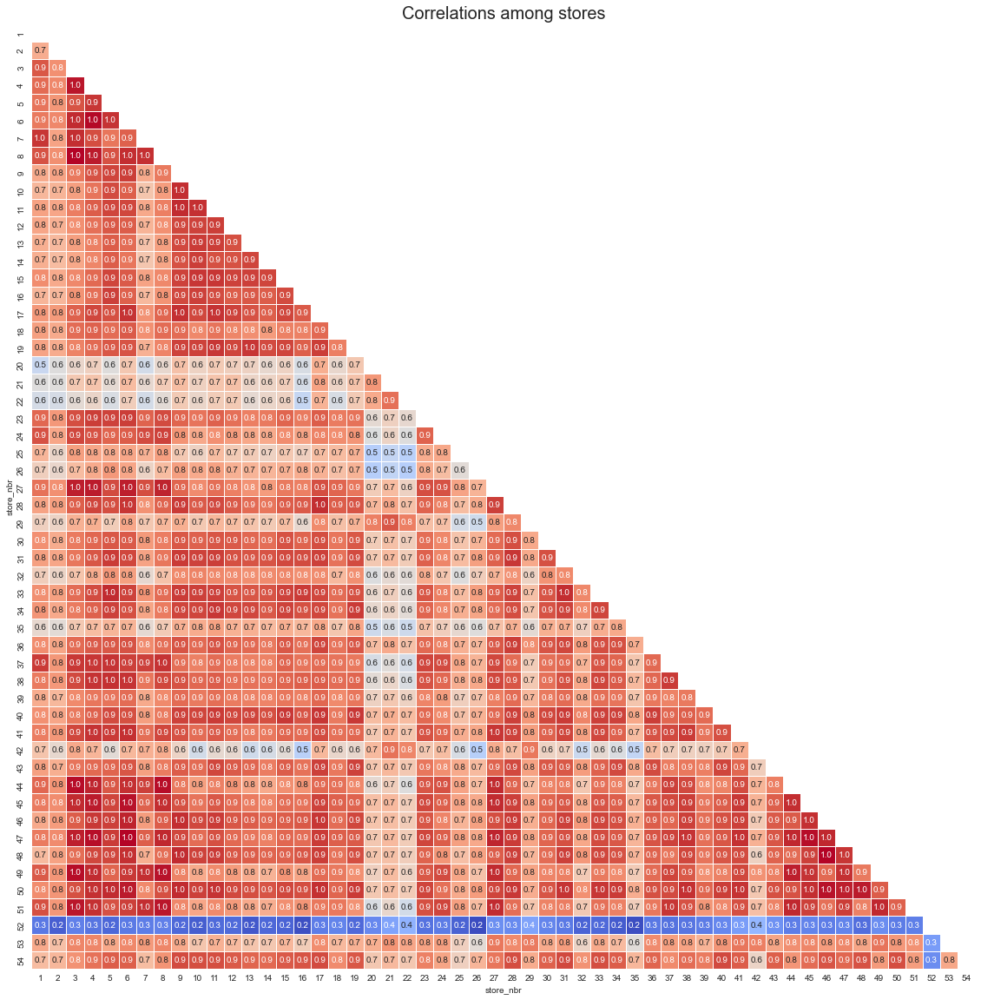

In [219]:
df_corr = df_train[["store_nbr", "sales"]]
df_corr["ind"] = 1
df_corr["ind"] = df_corr.groupby("store_nbr").ind.cumsum().values
df_corr = pd.pivot(df_corr, index="ind", columns="store_nbr", values="sales").corr()
mask = np.triu(df_corr.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(df_corr,
            annot=True,
            fmt='.1f',
            cmap='coolwarm',
            square=True,
            mask=mask,
            linewidths=1,
            cbar=False)
plt.title("Correlations among stores", fontsize=20)
plt.savefig("figures/images/corr_stores.png")
plt.show()

In [18]:
print("Correlation among all stores: ", df_corr.mean().mean(axis=0))

Correlation among all stores:  0.8047412406575022


Correlation among stores is generally high, this means not all stores have to necessarily be looked at in isolation.

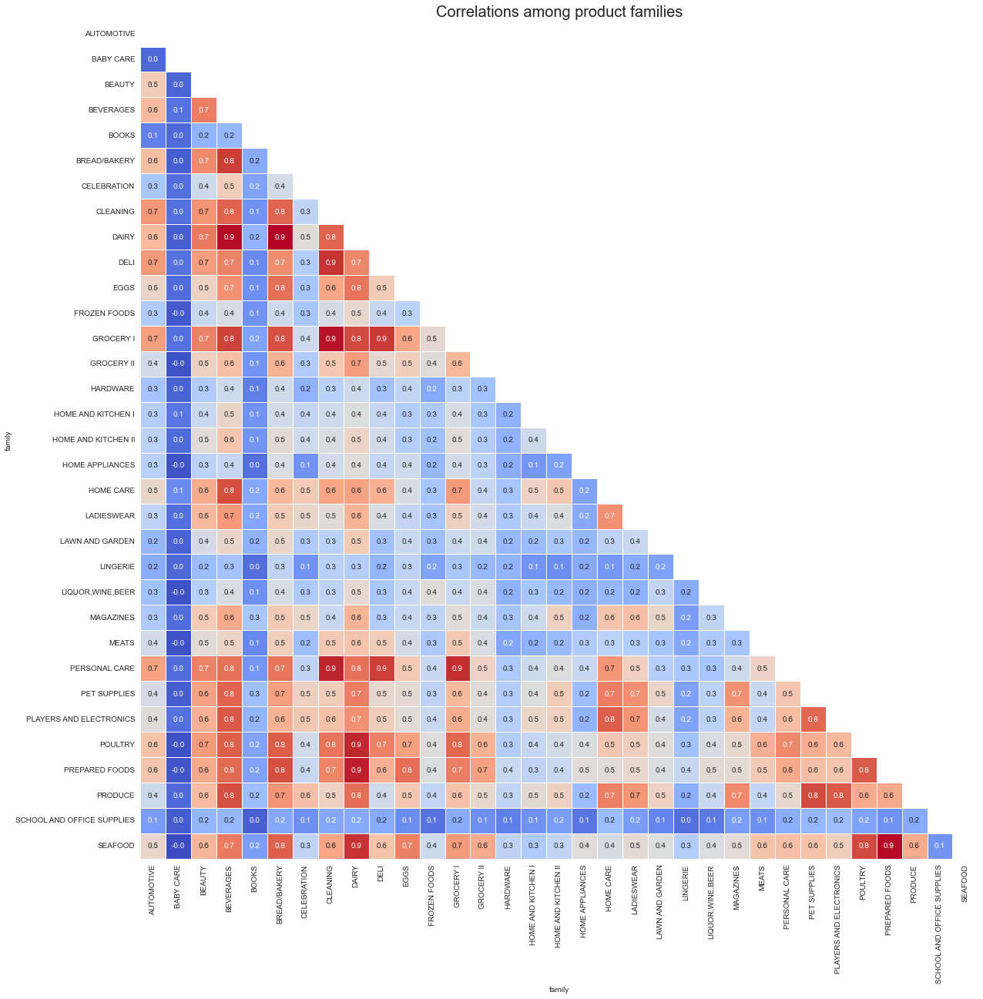

In [297]:
df_corr = df_train[["family", "sales"]]
df_corr["ind"] = 1
df_corr["ind"] = df_corr.groupby("family").ind.cumsum().values
df_corr = pd.pivot(df_corr, index="ind", columns="family", values="sales").corr()
mask = np.triu(df_corr.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(df_corr,
            annot=True,
            fmt='.1f',
            cmap='coolwarm',
            square=True,
            mask=mask,
            linewidths=1,
            cbar=False)
plt.title("Correlations among product families", fontsize=20)
plt.savefig("figures/images/corr_families.png")
plt.show()

In [298]:
print("Correlation among all product families: ", df_corr.mean().mean(axis=0))

Correlation among all product families:  0.42411932934932833


In [347]:
df_onpro = df_train.groupby('date').agg({"onpromotion": "sum", "sales": "sum"}).reset_index()
print("Correlation between sales and number of items on promotion: ", df_onpro.sales.corr(df_onpro.onpromotion))
print("Correlation sales and oil price: ", df_sales.sales.corr(df_oil.dcoilwtico))

Correlation sales and number of items on promotion:  0.5749429166866842
Correlation sales and oil price:  -0.5008054371815474


### Decomposition

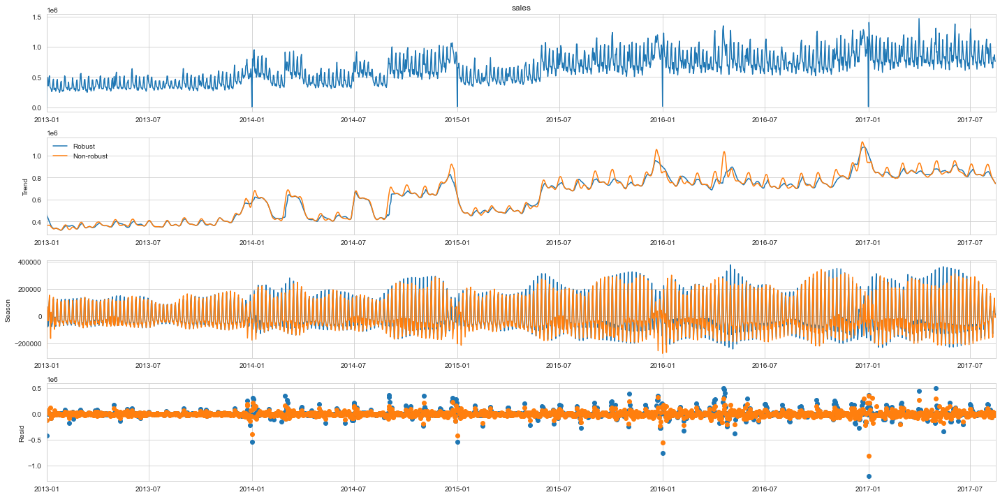

In [373]:
def add_stl_plot(fig, res, legend):
    """Add 3 plots from a second STL fit"""
    axs = fig.get_axes()
    comps = ["trend", "seasonal", "resid"]
    for ax, comp in zip(axs[1:], comps):
        series = getattr(res, comp)
        if comp == "resid":
            ax.plot(series, marker="o", linestyle="none")
        else:
            ax.plot(series)
            if comp == "trend":
                ax.legend(legend, frameon=False)


matplotlib.rcParams['figure.figsize'] = (20, 10)
# Period 7 = weekly pattern
res_robust = STL(df_sales.set_index('date')['sales'], period=7, robust=True).fit()
fig = res_robust.plot()
res_non_robust = STL(df_sales.set_index('date')['sales'], period=7, robust=False).fit()
add_stl_plot(fig, res_non_robust, ["Robust", "Non-robust"])
fig.savefig("figures/images/decomposition.png")

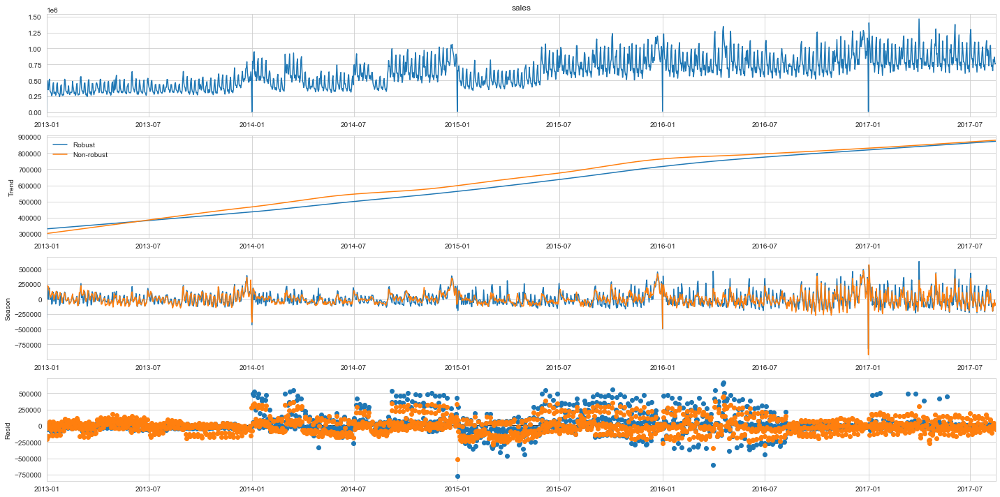

In [372]:
res_robust = STL(df_sales.set_index('date')['sales'], period=365, robust=True).fit()
fig = res_robust.plot()
res_non_robust = STL(df_sales.set_index('date')['sales'], period=365, robust=False).fit()
add_stl_plot(fig, res_non_robust, ["Robust", "Non-robust"])
fig.savefig("figures/images/decomposition_yearly.png")

### Autocorrelation

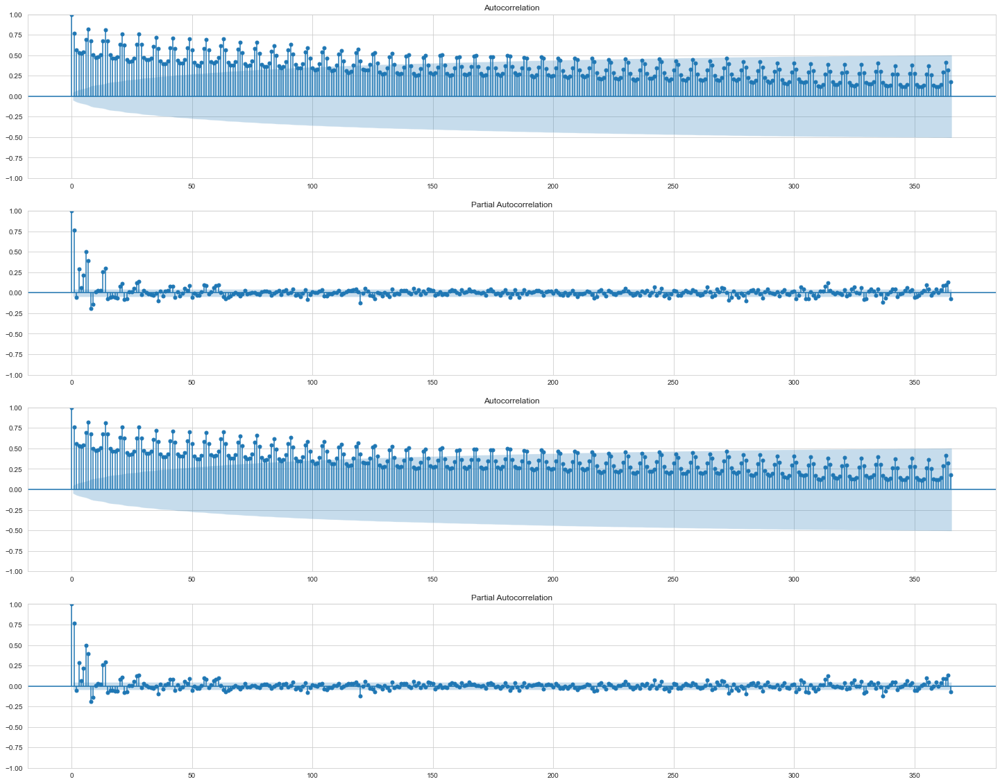

In [375]:
fig, ax = plt.subplots(4, 1, figsize=(25, 20))
plot_acf(df_sales.sales, lags=365, ax=ax[0])
plot_pacf(df_sales.sales, lags=365, ax=ax[1])
plot_acf(df_sales.sales, lags=365, ax=ax[2])
plot_pacf(df_sales.sales, lags=365, ax=ax[3])
# plt.savefig("figures/images/acf_pacf_365.png", bbox_inches = "tight")
plt.show()

The data shows clear weekly seasonality, as well as weak monthly and yearly seasonality.

#### Test for stationarity

A TS should be stationary, i.e. not possess a unit root. This can be tested e.g. with a unit root test or the Augmented Dickey-Fuller test with hypothesis H_0: the TS has a unit root.

In [23]:
# apply the ADF test
result = adfuller(df_sales.sales)


# print the test statistic and p-value
def adfuller_stats(result):
    print("\nStatistics analysis\n")
    print("Statistic Test : ", result[0])
    print("p-value : ", result[1])
    print("n_lags : ", result[2])
    print("No of observations: ", result[3])
    for key, value in result[4].items():
        print(f" critical value {key} : {value}")


adfuller_stats(result)


Statistics analysis

Statistic Test :  -2.6161957486048535
p-value :  0.08969592175787527
n_lags :  22
No of observations:  1661
 critical value 1% : -3.4342930672797065
 critical value 5% : -2.8632816397229064
 critical value 10% : -2.567697207194407


Number of lags is automatically determined (using model selection with AIC). With a p-value of ~0.08 it is not quite in the range of being statistically significant (assuming standard p=0.05) which makes sense when looking at the Trend graph in the decomposition above (clear trend).
This means a transformation/smoothing is necessary before applying models. First differencing is tried.

In [24]:
# df_resample = df_sales[["date", "sales"]].resample('D', on="date").sum()
df_resample = df_sales
df_resample['diff_sales'] = df_resample['sales'].diff()  # first difference
df_resample.dropna(inplace=True)
result = adfuller(df_resample.diff_sales, maxlag=90)

adfuller_stats(result)


Statistics analysis

Statistic Test :  -7.606958376425097
p-value :  2.3086371751093696e-11
n_lags :  63
No of observations:  1614
 critical value 1% : -3.434408073569016
 critical value 5% : -2.863332403139172
 critical value 10% : -2.567724238163897


In [207]:
def tsplot(y, lags=None, figsize=(12, 7)):
    if not isinstance(y, pd.Series):
        y = pd.Series(y)

    with plt.style.context(style='bmh'):
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))

        y.plot(ax=ts_ax)
        p_value = adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        plot_acf(y, lags=lags, ax=acf_ax)
        plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()
        return fig

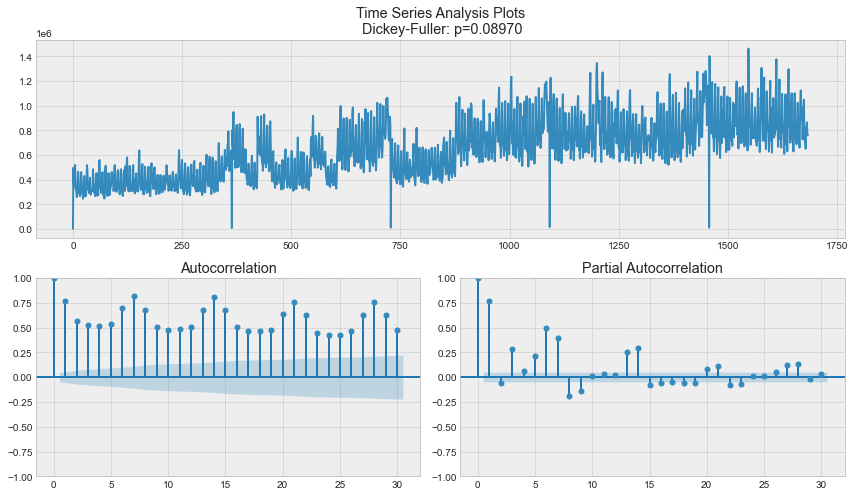

In [208]:
tsplot(df_sales.sales, lags=30).savefig("figures/images/adf.png")

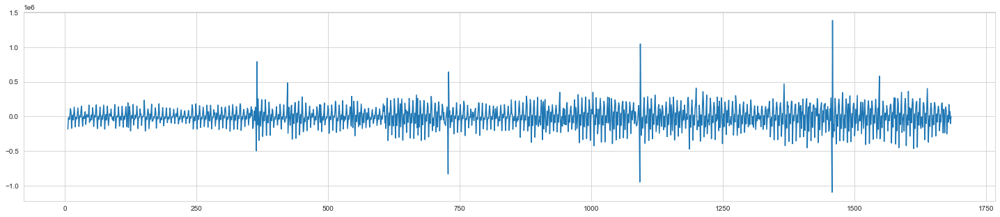

In [27]:
fig, ax = plt.subplots(1, 1, figsize=(25, 5))
plt.plot(df_resample.diff_sales)

Train, Validation (which is used to get a quick overview over performance of a model and hyperparameter choices), Test split.

In [171]:
df_sales_test = df_sales.set_index('date').sales.tail(15)
df_sales_val = df_sales.set_index('date').sales.tail(30).head(15)
df_sales_train = df_sales.set_index('date').sales.iloc[:-30]
df_sales_train

date
2013-01-01    2.511619e+03
2013-01-02    4.960924e+05
2013-01-03    3.614612e+05
2013-01-04    3.544597e+05
2013-01-05    4.773501e+05
                  ...     
2017-07-12    7.488000e+05
2017-07-13    6.296514e+05
2017-07-14    7.654896e+05
2017-07-15    9.690771e+05
2017-07-16    1.100804e+06
Name: sales, Length: 1654, dtype: float64

### Exponential Smoothing

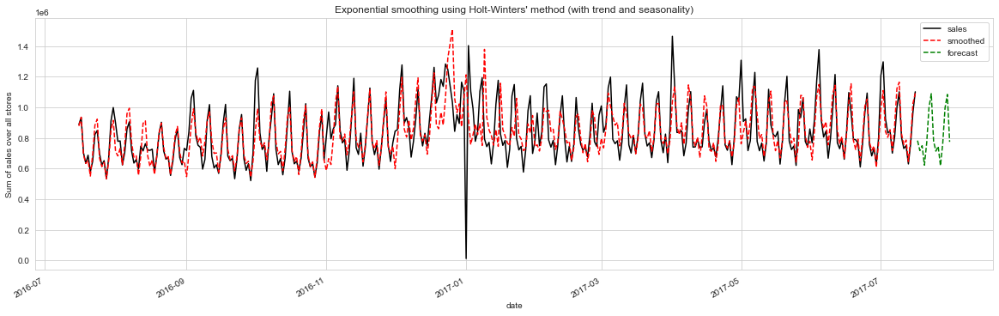

Forecasting sales using Holt-Winters method with both additive and multiplicative seasonality.


,Additive,Multiplicative,Additive Dam,Multiplica Dam,Multiplica RemBias
$\alpha$,2.171429e-01,2.171429e-01,2.525000e-01,2.171429e-01,2.171429e-01
$\beta$,1.670330e-02,1.670330e-02,1.000000e-04,1.000000e-04,1.670330e-02
$\phi$,NaN,NaN,9.900000e-01,9.900000e-01,NaN
$\gamma$,1.878857e-01,1.878857e-01,1.794000e-01,1.878857e-01,1.878857e-01
$l_0$,3.855987e+03,3.855987e+03,3.855987e+03,3.855987e+03,3.855987e+03
$b_0$,-3.358313e+01,-3.358313e+01,-3.358313e+01,-3.358313e+01,9.912907e-01
SSE,1.883030e+13,1.954851e+13,1.856897e+13,1.916193e+13,1.961239e+13


In [385]:
periods = 7
data1 = df_sales_train
params_es = [
    {"trend": "add", "seasonal": "add", "use_boxcox": True},
    {"trend": "add", "seasonal": "mul", "use_boxcox": True},
    {"trend": "add", "seasonal": "add", "damped_trend": True, "use_boxcox": True},
    {"trend": "add", "seasonal": "mul", "damped_trend": True, "use_boxcox": True},
    {"trend": "mul", "seasonal": "mul", "use_boxcox": True}
]
fit1 = ExponentialSmoothing(
    data1,
    seasonal_periods=periods,
    **params_es[0],
    initialization_method="estimated",
).fit()
fit2 = ExponentialSmoothing(
    data1,
    seasonal_periods=periods,
    **params_es[1],
    initialization_method="estimated",
).fit()
fit3 = ExponentialSmoothing(
    data1,
    seasonal_periods=periods,
    **params_es[2],
    initialization_method="estimated",
).fit()
fit4 = ExponentialSmoothing(
    data1,
    seasonal_periods=periods,
    **params_es[3],
    initialization_method="estimated",
).fit()
fit5 = ExponentialSmoothing(
    data1,
    seasonal_periods=periods,
    **params_es[4],
    initialization_method="estimated",
).fit(remove_bias=True)

results = pd.DataFrame(
    index=[r"$\alpha$", r"$\beta$", r"$\phi$", r"$\gamma$", r"$l_0$", "$b_0$", "SSE"]
)
params = [
    "smoothing_level",
    "smoothing_trend",
    "damping_trend",
    "smoothing_seasonal",
    "initial_level",
    "initial_trend",
]
results["Additive"] = [fit1.params[p] for p in params] + [fit1.sse]
results["Multiplicative"] = [fit2.params[p] for p in params] + [fit2.sse]
results["Additive Dam"] = [fit3.params[p] for p in params] + [fit3.sse]
results["Multiplica Dam"] = [fit4.params[p] for p in params] + [fit4.sse]
results["Multiplica RemBias"] = [fit5.params[p] for p in params] + [fit5.sse]

ax = data1[-365:].plot(
    figsize=(20, 6),
    color="black",
    title="Exponential smoothing using Holt-Winters' method (with trend and seasonality)",
    legend=True
)
ax.set_ylabel("Sum of sales over all stores")
ax.set_xlabel("Day")
fit1.fittedvalues[-365:].rename("smoothed").plot(ax=ax, style="--", color="red", legend=True)
# fit2.fittedvalues.plot(ax=ax, style="--", color="green")

fc = fit1.forecast(15)
fc.index = [data1.index.max() + pd.to_timedelta(i, unit="d") for i in range(1, 16)]
fc.rename("forecast").plot(
    ax=ax, style="--", color="green", legend=True
)
# fit2.forecast(15).rename("Holt-Winters (add-mul-seasonal)").plot(
#     ax=ax, style="--", color="green", legend=True
# )
plt.savefig("figures/images/expsm_fc.png", dpi=300, bboxinches="tight")
plt.show()
print(
    "Forecasting sales using Holt-Winters method with both additive and multiplicative seasonality."
)

results

In [179]:
df_forecast = fit4.forecast(15)
df_forecast.index = [df_sales_train.index.max() + pd.to_timedelta(i, unit="d") for i in range(1, 16)]
df_forecast

2017-07-17    8.090798e+05
2017-07-18    7.429817e+05
2017-07-19    7.732884e+05
2017-07-20    6.445670e+05
2017-07-21    7.898728e+05
2017-07-22    1.022044e+06
2017-07-23    1.117833e+06
2017-07-24    8.088989e+05
2017-07-25    7.428172e+05
2017-07-26    7.731190e+05
2017-07-27    6.444271e+05
2017-07-28    7.897032e+05
2017-07-29    1.021827e+06
2017-07-30    1.117598e+06
2017-07-31    8.087302e+05
dtype: float64

In [180]:
preds_expsm = fit4.simulate(15, repetitions=100).mean(axis=1)
preds_expsm.index = [df_sales_train.index.max() + pd.to_timedelta(i, unit="d") for i in range(1, 16)]
preds_expsm.index.rename('date', inplace=True)
preds_expsm

date
2017-07-17    8.313560e+05
2017-07-18    7.563831e+05
2017-07-19    7.698400e+05
2017-07-20    6.739032e+05
2017-07-21    7.901376e+05
2017-07-22    1.033689e+06
2017-07-23    1.108218e+06
2017-07-24    8.186400e+05
2017-07-25    7.671019e+05
2017-07-26    7.763152e+05
2017-07-27    6.511966e+05
2017-07-28    8.139066e+05
2017-07-29    1.024738e+06
2017-07-30    1.137544e+06
2017-07-31    8.623969e+05
dtype: float64

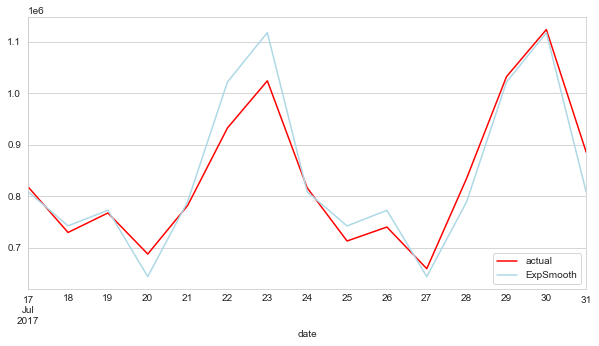

In [200]:
ax = df_sales_val.plot(color="red", label="actual")
df_forecast.plot(ax=ax, color="lightblue", style="-", figsize=[10, 5], label="ExpSmooth")
# preds_expsm_best.plot(ax=ax, color="green", style="--", figsize=[10, 5], label="SARIMA")
ax.legend(loc='lower right')
plt.show()

In [177]:
print("MAE: ", mean_absolute_error(df_sales_val, preds_expsm))
print("RMSE: ", sqrt(mean_squared_error(df_sales_val, preds_expsm)))

MAE:  38040.99800708845
RMSE:  49655.178485341574


#### Hyperparameter Optimization

In [178]:
models_es = [fit1, fit2, fit3, fit4, fit5]
rmse_all = list()
n = 100
for model in models_es:
    rmse = 0
    for i in range(0, n):
        df_sim = model.simulate(15, repetitions=100).mean(axis=1)
        df_sim.index = [df_sales_train.index.max() + pd.to_timedelta(i, unit="d") for i in range(1, 16)]
        rmse_temp = sqrt(mean_squared_error(df_sales_val, df_sim))
        # rmse = rmse if rmse < rmse_temp else rmse_temp
        rmse += rmse_temp
    rmse_all.append(round(rmse / n, 2))

print(rmse_all)

[49612.05, 47271.36, 46493.81, 45717.29, 48483.88]


Import self-built library for parallel CV hyperparameter optimization (https://github.com/nick2202/ts-hyperparam-opt).

In [428]:
from ts_hyperparam_opt import parallel_hyperparameter_optimization as pho
import importlib

importlib.reload(pho)
from functools import partial

In [54]:
# pho for ExpSmoothing
trend = ['add', 'mul', None]
damped_trend = [True, False]
seasonal = ['add', 'mul', None]
periods = [7]
use_boxcox = [True, False]
remove_bias = [True, False]
combinations = itertools.product(trend, damped_trend, seasonal, periods, use_boxcox, remove_bias)
params_exp_smoothing = [dict(zip(['trend', 'damped_trend', 'seasonal', 'periods', 'use_boxcox', 'remove_bias'], vals))
                        for vals in combinations]

if __name__ == '__main__':
    freeze_support()
    results_exp_smoothing = process_map(partial(pho.optimize_hyperparams, data=df_sales_train, func="exp_smoothing",
                                                n_steps=15, runs_per_split=10), params_exp_smoothing)

  0%|          | 0/72 [00:00<?, ?it/s]

In [60]:
# pho for SARIMA
params_sarima = [
    [(1, 1, 1), (1, 1, 1, 7)],
    [(1, 1, 0), (1, 1, 1, 7)],
    [(1, 1, 0), (1, 1, 0, 7)],
    [(1, 1, 0), (0, 1, 0, 7)],
    [(1, 1, 1), (1, 1, 0, 7)],
    [(1, 1, 1), (2, 1, 0, 7)],
    [(1, 1, 2), (1, 1, 2, 7)],
    [(1, 1, 1), (1, 1, 2, 7)],
    [(1, 1, 1), (2, 1, 2, 7)],
    [(1, 1, 0), (1, 1, 2, 7)],
    [(2, 1, 1), (2, 1, 1, 7)],
    [(2, 1, 1), (1, 1, 1, 7)],
    [(2, 1, 1), (1, 1, 0, 7)],
    [(1, 1, 2), (2, 1, 2, 7)],
    [(1, 1, 2), (1, 1, 0, 7)],
    [(0, 1, 1), (1, 1, 1, 7)]
]

if __name__ == '__main__':
    freeze_support()
    results_sarima = process_map(partial(pho.optimize_hyperparams, data=df_sales_train, func="sarima",
                                         n_steps=15), params_sarima)

aa


  0%|          | 0/16 [00:00<?, ?it/s]

Sorted results for ExpSmoothing and SARIMA.

In [57]:
sorted_list_es = pho.sort_results(results_exp_smoothing)
sorted_list_es

[{"{'trend': 'add', 'damped_trend': True, 'seasonal': 'mul', 'periods': 7, 'use_boxcox': True, 'remove_bias': True}": 108003.45},
 {"{'trend': None, 'damped_trend': False, 'seasonal': 'mul', 'periods': 7, 'use_boxcox': True, 'remove_bias': True}": 108611.14},
 {"{'trend': 'mul', 'damped_trend': True, 'seasonal': 'mul', 'periods': 7, 'use_boxcox': True, 'remove_bias': False}": 108993.4},
 {"{'trend': 'mul', 'damped_trend': True, 'seasonal': 'mul', 'periods': 7, 'use_boxcox': False, 'remove_bias': False}": 109004.72},
 {"{'trend': 'add', 'damped_trend': False, 'seasonal': 'mul', 'periods': 7, 'use_boxcox': True, 'remove_bias': True}": 109052.55},
 {"{'trend': None, 'damped_trend': False, 'seasonal': 'mul', 'periods': 7, 'use_boxcox': True, 'remove_bias': False}": 109072.77},
 {"{'trend': 'mul', 'damped_trend': True, 'seasonal': 'mul', 'periods': 7, 'use_boxcox': True, 'remove_bias': True}": 109107.0},
 {"{'trend': 'add', 'damped_trend': False, 'seasonal': 'mul', 'periods': 7, 'use_boxcox

In [63]:
# res_list_sa = [i for i in results_sarima if i is not None]
# sorted_list_sa = sorted(res_list_sa, key=lambda k: tuple(k.get(key, "") for key in sorted(k)))
sorted_list_sa = pho.sort_results(results_sarima)
sorted_list_sa

[{'[(1, 1, 1), (1, 1, 1, 7)]': 97702.51},
 {'[(1, 1, 1), (1, 1, 2, 7)]': 98217.09},
 {'[(1, 1, 1), (2, 1, 2, 7)]': 98323.79},
 {'[(2, 1, 1), (1, 1, 1, 7)]': 98914.69},
 {'[(2, 1, 1), (2, 1, 1, 7)]': 99480.4},
 {'[(1, 1, 2), (1, 1, 2, 7)]': 103837.69},
 {'[(1, 1, 2), (2, 1, 2, 7)]': 104556.6},
 {'[(1, 1, 1), (2, 1, 0, 7)]': 106634.36},
 {'[(2, 1, 1), (1, 1, 0, 7)]': 114723.45},
 {'[(1, 1, 1), (1, 1, 0, 7)]': 115058.12},
 {'[(1, 1, 2), (1, 1, 0, 7)]': 115262.59},
 {'[(0, 1, 1), (1, 1, 1, 7)]': 127121.11},
 {'[(1, 1, 0), (1, 1, 2, 7)]': 147153.27},
 {'[(1, 1, 0), (1, 1, 1, 7)]': 147874.97},
 {'[(1, 1, 0), (1, 1, 0, 7)]': 192017.18},
 {'[(1, 1, 0), (0, 1, 0, 7)]': 243382.75}]

Predict again using the optimized hyperparameters for ExpSm and taking the mean over several iterations.

In [345]:
params_es_best = {'trend': 'add', 'damped_trend': True, 'seasonal': 'mul', 'seasonal_periods': 7, 'use_boxcox': True}
fit_best = ExponentialSmoothing(
    df_sales_train,
    **params_es_best,
    initialization_method="estimated",
).fit(remove_bias=True)

preds_expsm_best = list()
rmse = 0
n = 100
for i in range(0, n):
    df_sim = fit_best.simulate(15, repetitions=100).mean(axis=1)
    df_sim.index = [df_sales_train.index.max() + pd.to_timedelta(i, unit="d") for i in range(1, 16)]
    rmse_temp = sqrt(mean_squared_error(df_sales_val, df_sim))
    rmse += rmse_temp
    preds_expsm_best.append(df_sim)

print("Average RMSE: ", rmse / n)
df_concat = pd.concat(preds_expsm_best)
preds_expsm_best = df_concat.groupby(df_concat.index).mean()
preds_expsm_best.index.rename("date", inplace=True)
preds_expsm_best

Average RMSE:  45419.69695272732


date
2017-07-17    7.899559e+05
2017-07-18    7.291385e+05
2017-07-19    7.573558e+05
2017-07-20    6.356061e+05
2017-07-21    7.777965e+05
2017-07-22    1.007913e+06
2017-07-23    1.093676e+06
2017-07-24    7.918584e+05
2017-07-25    7.273612e+05
2017-07-26    7.609980e+05
2017-07-27    6.356881e+05
2017-07-28    7.816339e+05
2017-07-29    1.013189e+06
2017-07-30    1.100391e+06
2017-07-31    7.952714e+05
dtype: float64

Predict using SARIMA with the optimal hyperparameters.

In [340]:
mod = sm.tsa.statespace.SARIMAX(df_sales_train, exog=None, order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
fit_s_best = mod.fit()

preds_sarima_best = fit_s_best.forecast(steps=15, exog=None)
preds_sarima_best.index = [df_sales_train.index.max() + pd.to_timedelta(i, unit="d") for i in range(1, 16)]
preds_sarima_best.index.rename("date", inplace=True)
mae = mean_absolute_error(df_sales_val, preds_sarima_best)
rmse = sqrt(mean_squared_error(df_sales_val, preds_sarima_best))
print("MAE: ", mae)
print("RMSE: ", rmse)

MAE:  36125.50778882035
RMSE:  47396.92327396367


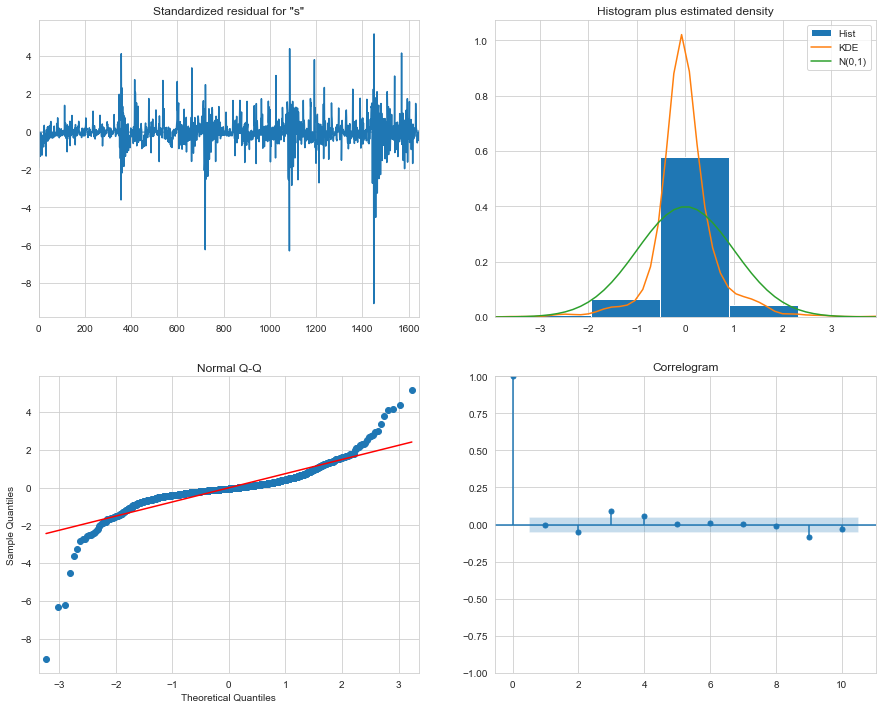

In [221]:
# check model diagnostics
fit_s_best.plot_diagnostics(figsize=(15,12))
plt.show()

Does not look perfect, will probably need to use additional features (i.e. SARIMAX).

In [341]:
from IPython.display import display_html

df1_styler = pd.DataFrame(df_sales_val).style.set_table_attributes("style='display:inline'").set_caption('actual')
df2_styler = pd.DataFrame(preds_expsm_best).style.set_table_attributes("style='display:inline'").set_caption(
    'preds_ExpSm')
df3_styler = pd.DataFrame(preds_sarima_best).style.set_table_attributes("style='display:inline'").set_caption(
    'preds_Sarima')

display_html(df1_styler._repr_html_() + df2_styler._repr_html_() + df3_styler._repr_html_(), raw=True)

,sales
date,
2017-07-17 00:00:00,818325.522149
2017-07-18 00:00:00,730133.708940
2017-07-19 00:00:00,767978.778078
2017-07-20 00:00:00,688288.067857
2017-07-21 00:00:00,782418.299219
2017-07-22 00:00:00,932902.046681
2017-07-23 00:00:00,1024288.741245
2017-07-24 00:00:00,816564.327096
2017-07-25 00:00:00,713581.632609


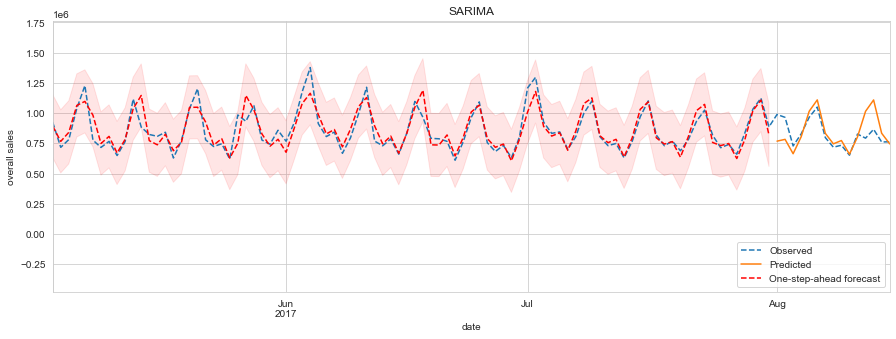

In [65]:
fig, ax = plt.subplots(figsize=(15, 5))
ax.set(title='SARIMA', xlabel='date', ylabel='overall sales')

# Plot data points
pd.concat([df_sales_train.tail(90), df_sales_val]).plot(ax=ax, style='--', label='Observed')

predict = fit_s_best.get_prediction()
predict_ci = predict.conf_int()

# Plot predictions
predict.predicted_mean.tail(90).plot(ax=ax, style='r--', label='One-step-ahead forecast')
preds_sarima_best.plot(ax=ax, style='-', label='Predicted')
ci = predict_ci

ax.fill_between(ci.index, ci.iloc[:, 0], ci.iloc[:, 1], color='r', alpha=0.1)

legend = ax.legend(loc='lower right')
# plt.savefig("./figs/sarima.png",bbox_inches="tight")

### Use SARIMA for single product families.

It would be best to predict the sales for every product family (and ideally every store) individually, this approach will only be shown exemplarily for one product family due to time and computing resources constraints.

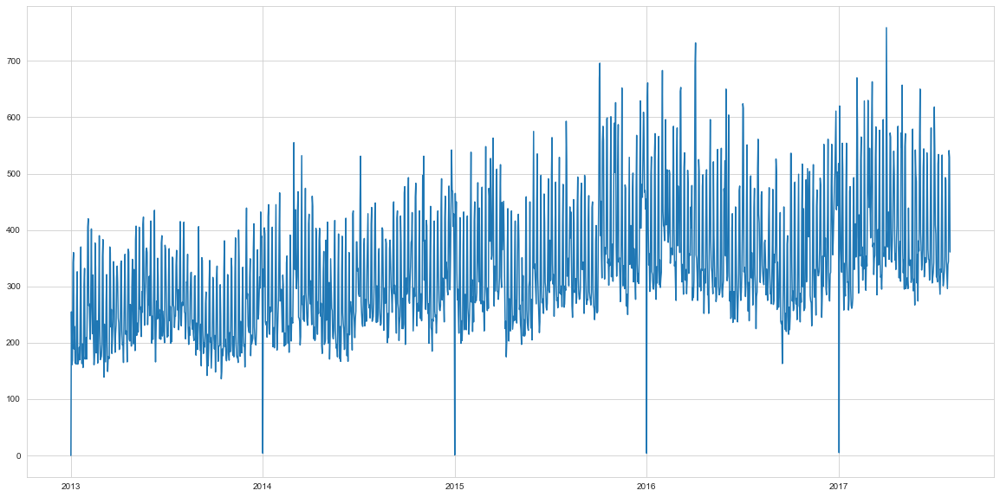

In [111]:
df_sales_auto = df_train.loc[df_train.family == "AUTOMOTIVE"].groupby('date').agg({"sales": "sum"}).reset_index()
df_sales_auto_val = df_sales_auto.set_index('date').sales.tail(15)
df_sales_auto_train = df_sales_auto.set_index('date').sales.iloc[:-15]
plt.plot(df_sales_auto_train)
plt.show()

In [211]:
mod_auto = sm.tsa.statespace.SARIMAX(df_sales_auto_train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
fit_s_best_auto = mod_auto.fit()

preds_sarima_best_auto = fit_s_best_auto.forecast(steps=15)
preds_sarima_best_auto.index = [df_sales_train.index.max() + pd.to_timedelta(i, unit="d") for i in range(1, 16)]
mae1 = mean_absolute_error(df_sales_auto_val, preds_sarima_best_auto)
rmse1 = sqrt(mean_squared_error(df_sales_auto_val, preds_sarima_best_auto))
rmsle1 = rmsle(df_sales_auto_val.sales, preds_sarima_best_auto)
print("MAE: ", mae1)
print("RMSE: ", rmse1)
print("RMSLE: ", rmsle1)

MAE:  50.93116607370418
RMSE:  66.30327033632068


### SARIMAX

SARIMA with the eXogeneous variables

#### Feature generation

In [328]:
df = df_sales.drop(columns="sales_ma")
# date features
df = pd.concat([df, pd.get_dummies(df['date'].dt.dayofweek + 1, prefix='day_of_week')], axis=1)
df['is_year_start'] = df.date.dt.is_year_start.astype("int8")
df['is_year_end'] = df.date.dt.is_year_end.astype("int8")
df["is_wknd"] = (df.date.dt.weekday // 5).astype("int8")
df['is_month_start'] = df.date.dt.is_month_start.astype("int8")
df['is_month_end'] = df.date.dt.is_month_end.astype("int8")
df = pd.concat([df, pd.get_dummies((df.date.apply(lambda d: (d.day - 1) // 7 + 1)).astype("int8"), prefix='week_of_month')], axis=1)

# other features
df = pd.concat([df, df_train.groupby('date').agg({"onpromotion": "sum"}).reset_index()["onpromotion"]], axis=1)
df_holidays["is_nat_holiday"] = np.where(df_holidays['locale'] == "National",1,0)
df = pd.merge(df, df_holidays.loc[df_holidays.is_nat_holiday == 1].set_index("date")["description"], on="date", how="left")
df = pd.concat([df, pd.get_dummies(df["description"])], axis=1)
df.drop(columns="description", inplace=True)

# create new train, val and test sets
df_sales_ext = df
df_sales_ext.set_index('date', inplace=True)
df_sales_ext_test = df_sales_ext.tail(15)
df_sales_ext_val = df_sales_ext.tail(30).head(15)
df_sales_ext_train = df_sales_ext.iloc[:-30]
df_sales_ext_train_full = df_sales_ext.iloc[:-15]

# data without time features
cols_time_feat = ['day_of_week_1', 'day_of_week_2',
                  'day_of_week_3', 'day_of_week_4', 'day_of_week_5', 'day_of_week_6',
                  'day_of_week_7', 'is_year_start', 'is_year_end', 'is_wknd']
df_sales_ext_nt = df_sales_ext.drop(columns=cols_time_feat)
df_sales_ext_nt_test = df_sales_ext_nt.tail(15)
df_sales_ext_nt_val = df_sales_ext_nt.tail(30).head(15)
df_sales_ext_nt_train = df_sales_ext_nt.iloc[:-30]
df_sales_ext_nt_train_full = df_sales_ext_nt.iloc[:-15]
df_sales_ext_train_full

,sales,onpromotion,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6,day_of_week_7,is_year_start,...,Terremoto Manabi+5,Terremoto Manabi+6,Terremoto Manabi+7,Terremoto Manabi+8,Terremoto Manabi+9,Traslado Batalla de Pichincha,Traslado Independencia de Guayaquil,Traslado Primer Grito de Independencia,Traslado Primer dia del ano,Viernes Santo
date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,2.511619e+03,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2013-01-02,4.960924e+05,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2013-01-03,3.614612e+05,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2013-01-04,3.544597e+05,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2013-01-05,4.773501e+05,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-27,6.598498e+05,8001,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2017-07-28,8.350997e+05,13850,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2017-07-29,1.032311e+06,9099,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [388]:
mod_sarimax = sm.tsa.statespace.SARIMAX(endog=df_sales_ext_train.sales,
                                     exog=df_sales_ext_train.drop(columns="sales"),
                                     order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
fit_sx = mod_sarimax.fit()

preds_sarimax = fit_sx.forecast(steps=15, exog=df_sales_ext_val.drop(columns="sales"))
preds_sarimax.index = [df_sales_ext_train.index.max() + pd.to_timedelta(i, unit="d") for i in range(1, 16)]
mae1 = mean_absolute_error(df_sales_ext_val.sales, preds_sarimax)
rmse1 = sqrt(mean_squared_error(df_sales_ext_val.sales, preds_sarimax))
print("MAE: ", mae1)
print("RMSE: ", rmse1)

MAE:  55038.14205198617
RMSE:  65735.88932807377
MAE:  55038.14205198617
RMSE:  65735.88932807377


Using CV:

In [429]:
pho.optimize_hyperparams([(1, 1, 1), (1, 1, 1, 7)], df_sales_ext_train, "sarimax", n_steps=15)

{'[(1, 1, 1), (1, 1, 1, 7)]': 88867.16}

## Forecasting the last 15 days with all 3(/4) models and comparing it to the test set

In [336]:
params_es_best = {'trend': 'add', 'damped_trend': True, 'seasonal': 'mul', 'seasonal_periods': 7, 'use_boxcox': True}
fit_test = ExponentialSmoothing(
    df_sales_ext_train_full.sales,
    **params_es_best,
    initialization_method="estimated",
).fit(remove_bias=True)

preds_expsm_test = list()
mae1 = 0
rmse1 = 0
rmsle1 = 0
n = 10
for i in range(0, n):
    df_sim = fit_test.simulate(15, repetitions=100).mean(axis=1)
    df_sim.index = [df_sales_ext_train_full.index.max() + pd.to_timedelta(i, unit="d") for i in range(1, 16)]
    mae_temp = mean_absolute_error(df_sales_ext_test.sales, df_sim)
    mae1 += mae_temp
    rmse_temp2 = sqrt(mean_squared_error(df_sales_ext_test.sales, df_sim))
    rmse1 += rmse_temp2
    rmsle_temp = rmsle(df_sales_ext_test.sales, df_sim)
    rmsle1 += rmsle_temp
    preds_expsm_test.append(df_sim)

print("MAE: ", mae1/n)
print("RMSE: ", rmse1/n)
print("RMSLE: ", rmsle1/n)
df_concat = pd.concat(preds_expsm_test)
preds_expsm_test = df_concat.groupby(df_concat.index).mean()

MAE:  92287.58303195355
RMSE:  125555.88111105403
RMSLE:  0.13866132528279243


### SARIMA(X)

In [313]:
def test_sarima(endog, exog_train=None, exog_test=None):
    mod = sm.tsa.statespace.SARIMAX(endog=endog,
                                            exog=exog_train,
                                            order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
    fit = mod.fit()

    preds = fit.forecast(steps=15, exog=exog_test)
    preds.index = [df_sales_ext_train_full.index.max() + pd.to_timedelta(i, unit="d") for i in range(1, 16)]
    mae1 = mean_absolute_error(df_sales_ext_test.sales, preds)
    rmse1 = sqrt(mean_squared_error(df_sales_ext_test.sales, preds))
    rmsle1 = rmsle(df_sales_ext_test.sales, preds)
    print("MAE: ", mae1)
    print("RMSE: ", rmse1)
    print("RMSLE: ", rmsle1)
    return preds

SARIMA:

In [315]:
preds_sarima_test = test_sarima(df_sales_ext_train_full.sales)

MAE:  84461.06320559964
RMSE:  116867.56759636533
RMSLE:  0.13022207977140923


SARIMAX (with time features):

In [329]:
preds_sarimax_test = test_sarima(df_sales_ext_train_full.sales, df_sales_ext_train_full.drop(columns="sales"), df_sales_ext_test.drop(columns="sales"))

MAE:  89452.31413180911
RMSE:  110509.42459444399
RMSLE:  0.1205226918080571


SARIMAX (without time features):

In [317]:
preds_sarimax_nt_test = test_sarima(df_sales_ext_nt_train_full.sales, df_sales_ext_nt_train_full.drop(columns="sales"), df_sales_ext_nt_test.drop(columns="sales"))

MAE:  87837.61646388772
RMSE:  117312.66964649565
RMSLE:  0.13219291324997998


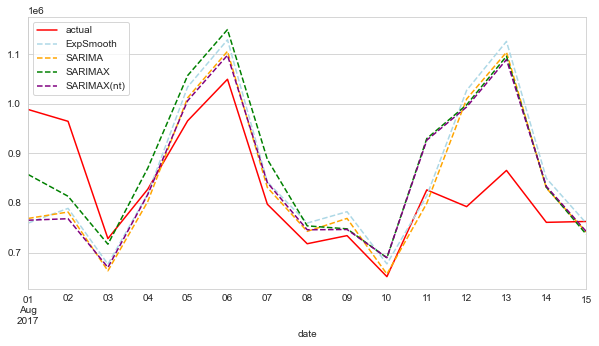

In [350]:
ax = df_sales_ext_test.sales.plot(color="red", label="actual")
preds_expsm_test.plot(ax=ax, color="lightblue", style="--", figsize=[10, 5], label="ExpSmooth")
preds_sarima_test.plot(ax=ax, color="orange", style="--", figsize=[10, 5], label="SARIMA")
preds_sarimax_test.plot(ax=ax, color="green", style="--", figsize=[10, 5], label="SARIMAX")
preds_sarimax_nt_test.plot(ax=ax, color="purple", style="--", figsize=[10, 5], label="SARIMAX(nt)")
ax.legend(loc='upper left')
plt.savefig("figures/images/all_preds.png")
plt.show()

## Sources + Bibliography

- https://gist.github.com/tomron/8798256fcee5438edd58c17654adf443
- http://faculty.washington.edu/ezivot/econ584/notes/unitroot.pdf
- https://machinelearningmastery.com/how-to-grid-search-triple-exponential-smoothing-for-time-series-forecasting-in-python/
- https://medium.com/@soumyachess1496/cross-validation-in-time-series-566ae4981ce4
- https://github.com/Oliss4t/BHT_Store_Sales_Time_Series_Forecasting
- https://www.kaggle.com/code/florianformentini/store-sales-analysis-and-forecasting
- https://www.kaggle.com/code/kashishrastogi/store-sales-analysis-time-serie
- https://www.kaggle.com/code/ekrembayar/store-sales-ts-forecasting-a-comprehensive-guide